# Purpose of the project

Over 100 million people visit Quora every month, so it's no surprise that many people ask similarly worded questions. Multiple questions with the same intent can cause seekers to spend more time finding the best answer to their question, and make writers feel they need to answer multiple versions of the same question. 

This Jupyter Notebook documents the process of training a machine learning model to predict whether a pair of questions on Quora are duplicate or not. The goal of this project is to develop an application that allows users to input two questions and get predictions about whether they are duplicate or not.


## Data Overview
1) Data will be in a file Train.csv

2) Train.csv contains 5 columns : qid1, qid2, question1, question2, is_duplicate

3) Data fields

- id - the id of a training set question pair
- qid1, qid2 - unique ids of each question 
- question1, question2 - the full text of each question
- is_duplicate - the target variable, set to 1 if question1 and question2 have essentially the same meaning, and 0 otherwise.

## Source 
https://www.kaggle.com/c/quora-question-pairs


## Type of Machine Leaning Problem
It is a binary classification problem, for a given pair of questions we need to predict if they are duplicate or not.

# Importing Required Libraries 

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
import matplotlib.cm as cm
import seaborn as sns
import re
from bs4 import BeautifulSoup
import nltk
from collections import Counter 
import distance
import plotly.express as px
from wordcloud import WordCloud, STOPWORDS
from subprocess import check_output
%matplotlib inline
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import os
import gc
import sys
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import CountVectorizer
import re
from nltk.corpus import stopwords
from tqdm import tqdm
from sklearn.preprocessing import normalize
from nltk.stem import PorterStemmer
import collections
import warnings
warnings.filterwarnings('ignore')

# Load the dataset

In [2]:
# Read the data
df = pd.read_csv('train.csv')

In [3]:
# Since the dataset is huge, using a sample of the data
df = df.sample(100000, random_state = 2)

In [4]:
# Display the top five rows 
df.head()

,id,qid1,qid2,question1,question2,is_duplicate
398782,398782,496695,532029,What is the best marketing automation tool for...,What is the best marketing automation tool for...,1
115086,115086,187729,187730,I am poor but I want to invest. What should I do?,I am quite poor and I want to be very rich. Wh...,0
327711,327711,454161,454162,I am from India and live abroad. I met a guy f...,T.I.E.T to Thapar University to Thapar Univers...,0
367788,367788,498109,491396,Why do so many people in the U.S. hate the sou...,My boyfriend doesnt feel guilty when he hurts ...,0
151235,151235,237843,50930,Consequences of Bhopal gas tragedy?,What was the reason behind the Bhopal gas trag...,0


# Exploratory Data Analysis

In [5]:
# Checking for null values 
df.isna().sum()

id              0
qid1            0
qid2            0
question1       0
question2       1
is_duplicate    0
dtype: int64

In [6]:
# Since there are only 3 null values in such a large dataset, it makes sense to drop the null values
df.dropna(inplace = True)

In [7]:
# Checking for duplicated rows
df.duplicated().sum()

0

In [8]:
# Number of duplicated values
df['is_duplicate'].value_counts()

## 0 means non-duplicate questions
## 1 means duplicate questions

0    63214
1    36785
Name: is_duplicate, dtype: int64

<AxesSubplot:>

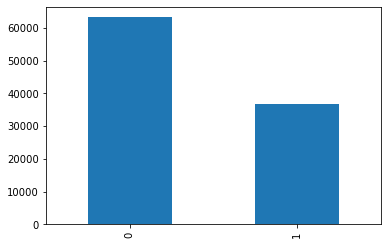

In [9]:
df['is_duplicate'].value_counts().plot(kind='bar')

The dataset is somewhat unbalanced. 

In [10]:
## lets seee the % distribution of the dataset
(df['is_duplicate'].value_counts() / df['is_duplicate'].count())*100

0    63.214632
1    36.785368
Name: is_duplicate, dtype: float64

In [11]:
## out of all the question in qid1 and qid2, lets see how many are unique
# qid1, qid2 - unique ids of each question 

qid = pd.Series(df['qid1'].tolist() + df['qid2'].tolist())
print("Number of unique questions: ", np.unique(qid).shape[0])


## if question getting repeated, the id will repeat and hence qid_id will have count > 1
print("Number of repeated questions: ", (qid.value_counts()>1).sum())

Number of unique questions:  165974
Number of repeated questions:  19488


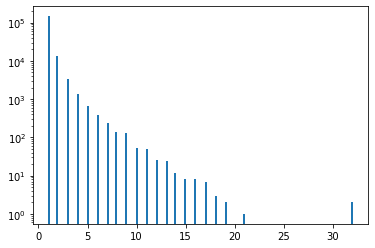

In [12]:
# Repeated questions histogram
plt.hist(qid.value_counts().values,bins=150)
plt.yscale('log')

## There is a question in the dataset that has occured one than 30 times
## Around 10^5 questions occur once

# Data Preprocessing

Data preprocessing is an essential step to clean and prepare the text data for feature extraction and modeling. The following preprocessing steps are performed:

- Removing special characters and decontracting words.
- Removing HTML tags using BeautifulSoup.
- Removing punctuation and tokenizing the text.

In [13]:
# Checking for null values 
df.isna().sum()

id              0
qid1            0
qid2            0
question1       0
question2       0
is_duplicate    0
dtype: int64

In [14]:
# Since there are only 3 null values in such a large dataset, it makes sense to drop the null values
df.dropna(inplace = True)

In [15]:
# Created a function for preprocessing
def preprocess(q):
    
    q = str(q).lower().strip()
    
    # Replacing certain special characters with their string equivalents
    q = q.replace('%', ' percent')
    q = q.replace('$', ' dollar ')
    q = q.replace('₹', ' rupee ')
    q = q.replace('€', ' euro ')
    q = q.replace('@', ' at ')
    
    # The pattern '[math]' appears around 900 times in the whole dataset.
    q = q.replace('[math]', '')
    
    # Replacing some numbers with string equivalents 
    q = q.replace(',000,000,000 ', 'b ')
    q = q.replace(',000,000 ', 'm ')
    q = q.replace(',000 ', 'k ')
    q = re.sub(r'([0-9]+)000000000', r'\1b', q)
    q = re.sub(r'([0-9]+)000000', r'\1m', q)
    q = re.sub(r'([0-9]+)000', r'\1k', q)
    
    # Decontracting words
    # https://en.wikipedia.org/wiki/Wikipedia%3aList_of_English_contractions
    # https://stackoverflow.com/a/19794953
    contractions = { 
    "ain't": "am not",
    "aren't": "are not",
    "can't": "can not",
    "can't've": "can not have",
    "'cause": "because",
    "could've": "could have",
    "couldn't": "could not",
    "couldn't've": "could not have",
    "didn't": "did not",
    "doesn't": "does not",
    "don't": "do not",
    "hadn't": "had not",
    "hadn't've": "had not have",
    "hasn't": "has not",
    "haven't": "have not",
    "he'd": "he would",
    "he'd've": "he would have",
    "he'll": "he will",
    "he'll've": "he will have",
    "he's": "he is",
    "how'd": "how did",
    "how'd'y": "how do you",
    "how'll": "how will",
    "how's": "how is",
    "i'd": "i would",
    "i'd've": "i would have",
    "i'll": "i will",
    "i'll've": "i will have",
    "i'm": "i am",
    "i've": "i have",
    "isn't": "is not",
    "it'd": "it would",
    "it'd've": "it would have",
    "it'll": "it will",
    "it'll've": "it will have",
    "it's": "it is",
    "let's": "let us",
    "ma'am": "madam",
    "mayn't": "may not",
    "might've": "might have",
    "mightn't": "might not",
    "mightn't've": "might not have",
    "must've": "must have",
    "mustn't": "must not",
    "mustn't've": "must not have",
    "needn't": "need not",
    "needn't've": "need not have",
    "o'clock": "of the clock",
    "oughtn't": "ought not",
    "oughtn't've": "ought not have",
    "shan't": "shall not",
    "sha'n't": "shall not",
    "shan't've": "shall not have",
    "she'd": "she would",
    "she'd've": "she would have",
    "she'll": "she will",
    "she'll've": "she will have",
    "she's": "she is",
    "should've": "should have",
    "shouldn't": "should not",
    "shouldn't've": "should not have",
    "so've": "so have",
    "so's": "so as",
    "that'd": "that would",
    "that'd've": "that would have",
    "that's": "that is",
    "there'd": "there would",
    "there'd've": "there would have",
    "there's": "there is",
    "they'd": "they would",
    "they'd've": "they would have",
    "they'll": "they will",
    "they'll've": "they will have",
    "they're": "they are",
    "they've": "they have",
    "to've": "to have",
    "wasn't": "was not",
    "we'd": "we would",
    "we'd've": "we would have",
    "we'll": "we will",
    "we'll've": "we will have",
    "we're": "we are",
    "we've": "we have",
    "weren't": "were not",
    "what'll": "what will",
    "what'll've": "what will have",
    "what're": "what are",
    "what's": "what is",
    "what've": "what have",
    "when's": "when is",
    "when've": "when have",
    "where'd": "where did",
    "where's": "where is",
    "where've": "where have",
    "who'll": "who will",
    "who'll've": "who will have",
    "who's": "who is",
    "who've": "who have",
    "why's": "why is",
    "why've": "why have",
    "will've": "will have",
    "won't": "will not",
    "won't've": "will not have",
    "would've": "would have",
    "wouldn't": "would not",
    "wouldn't've": "would not have",
    "y'all": "you all",
    "y'all'd": "you all would",
    "y'all'd've": "you all would have",
    "y'all're": "you all are",
    "y'all've": "you all have",
    "you'd": "you would",
    "you'd've": "you would have",
    "you'll": "you will",
    "you'll've": "you will have",
    "you're": "you are",
    "you've": "you have"
    }

    q_decontracted = []

    for word in q.split():
        if word in contractions:
            word = contractions[word]

        q_decontracted.append(word)

    q = ' '.join(q_decontracted)
    q = q.replace("'ve", " have")
    q = q.replace("n't", " not")
    q = q.replace("'re", " are")
    q = q.replace("'ll", " will")
    
    # Removing HTML tags
    q = BeautifulSoup(q)
    q = q.get_text()
    
    # Remove punctuations
    pattern = re.compile('\W')
    q = re.sub(pattern, ' ', q).strip()
    
    return q   

In [16]:
# Checking the output from the preprocess function
preprocess("I've already! wasn't <b>done</b>?")

'i have already  was not done'

In [17]:
# Applying the preprocessing to question1 and question2 columns in the dataframe
df['question1'] = df['question1'].apply(preprocess)
df['question2'] = df['question2'].apply(preprocess)

In [18]:
# Display the dataset after preprocessing
df.head()

,id,qid1,qid2,question1,question2,is_duplicate
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0
367788,367788,498109,491396,why do so many people in the u s hate the sou...,my boyfriend doesnt feel guilty when he hurts ...,0
151235,151235,237843,50930,consequences of bhopal gas tragedy,what was the reason behind the bhopal gas tragedy,0


# Basic Feature Engineering 

In this step, basic features are extracted from the preprocessed text. The basic features include:

- q1_len: The length of the first question in terms of the number of words.
- q2_len: The length of the second question in terms of the number of words.
- q1_words: A list of words in the first question after tokenization.
- q2_words: A list of words in the second question after tokenization.
- words_common: The number of words that are common between the two questions.
- words_total: The total number of unique words in both questions combined.
- word_share: The ratio of words_common to words_total, indicating the extent of word overlap between the questions.

In [19]:
# Find the length of question1 and question2
df['q1_len'] = df['question1'].str.len() 
df['q2_len'] = df['question2'].str.len()

In [20]:
# Counting the number of words in each question1 and question2 
df['q1_num_words'] = df['question1'].apply(lambda row: len(row.split(" ")))
df['q2_num_words'] = df['question2'].apply(lambda row: len(row.split(" ")))
df.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21
367788,367788,498109,491396,why do so many people in the u s hate the sou...,my boyfriend doesnt feel guilty when he hurts ...,0,58,145,14,32
151235,151235,237843,50930,consequences of bhopal gas tragedy,what was the reason behind the bhopal gas tragedy,0,34,49,5,9


In [21]:
# Find the number of common words in question1 and question2 
def common_words(row):
    
    # Converted to a set to only keep unique words
    w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
    w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))    
    return len(w1 & w2)

In [22]:
# Add the word_common column to the dataframe
df['word_common'] = df.apply(common_words, axis=1)
df.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,word_common
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,12
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,8
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,4
367788,367788,498109,491396,why do so many people in the u s hate the sou...,my boyfriend doesnt feel guilty when he hurts ...,0,58,145,14,32,1
151235,151235,237843,50930,consequences of bhopal gas tragedy,what was the reason behind the bhopal gas tragedy,0,34,49,5,9,3


In [23]:
# The total number of unique words in both questions combined.
def total_words(row):
    w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
    w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))    
    return (len(w1) + len(w2))

In [24]:
# Add word_total column to the dataframe
df['word_total'] = df.apply(total_words, axis=1)
df.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,word_common,word_total
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,12,26
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,8,24
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,4,38
367788,367788,498109,491396,why do so many people in the u s hate the sou...,my boyfriend doesnt feel guilty when he hurts ...,0,58,145,14,32,1,34
151235,151235,237843,50930,consequences of bhopal gas tragedy,what was the reason behind the bhopal gas tragedy,0,34,49,5,9,3,13


In [25]:
# The ratio of words_common to words_total, indicating the extent of word overlap between the questions.
df['word_share'] = round(df['word_common']/df['word_total'],2)
df.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,word_common,word_total,word_share
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,12,26,0.46
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,8,24,0.33
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,4,38,0.11
367788,367788,498109,491396,why do so many people in the u s hate the sou...,my boyfriend doesnt feel guilty when he hurts ...,0,58,145,14,32,1,34,0.03
151235,151235,237843,50930,consequences of bhopal gas tragedy,what was the reason behind the bhopal gas tragedy,0,34,49,5,9,3,13,0.23


# Advanced Feature Engineering

To capture more nuanced patterns and similarities between the questions, I have create advanced features. The advanced features include:

1. **Token Features:**

- cwc_min: Ratio of common words to the length of the smaller question.
- cwc_max: Ratio of common words to the length of the larger question.
- csc_min: Ratio of common stop words to the smaller stop word count among the two questions.
- csc_max: Ratio of common stop words to the larger stop word count among the two questions.
- ctc_min: Ratio of common tokens to the smaller token count among the two questions.
- ctc_max: Ratio of common tokens to the larger token count among the two questions.
- last_word_eq: 1 if the last word in the two questions is the same, 0 otherwise.
- first_word_eq: 1 if the first word in the two questions is the same, 0 otherwise.

2. **Length Based Features:**

- mean_len: Mean length of the two questions (number of words).
- abs_len_diff: Absolute difference between the length of the two questions (number of words).
- longest_substr_ratio: Ratio of the length of the longest common substring among the two questions to the length of the smaller question.

3. **Fuzzy Features:**

- fuzz_ratio: fuzz_ratio score from fuzzywuzzy.
- fuzz_partial_ratio: fuzz_partial_ratio from fuzzywuzzy.
- token_sort_ratio: token_sort_ratio from fuzzywuzzy.
- token_set_ratio: token_set_ratio from fuzzywuzzy.

In [26]:
# Advanced Features: Token Features
from nltk.corpus import stopwords

def fetch_token_features(row):
    
    q1 = row['question1']
    q2 = row['question2']
    
    # To avoid dividing by 0
    SAFE_DIV = 0.0001 

    STOP_WORDS = stopwords.words("english")
    
    token_features = [0.0]*8
    
    # Converting the Sentence into Tokens: 
    q1_tokens = q1.split()
    q2_tokens = q2.split()
    
    if len(q1_tokens) == 0 or len(q2_tokens) == 0:
        return token_features

    # Get the non-stopwords in Questions
    q1_words = set([word for word in q1_tokens if word not in STOP_WORDS])
    q2_words = set([word for word in q2_tokens if word not in STOP_WORDS])
    
    #Get the stopwords in Questions
    q1_stops = set([word for word in q1_tokens if word in STOP_WORDS])
    q2_stops = set([word for word in q2_tokens if word in STOP_WORDS])
    
    # Get the common non-stopwords from Question pair
    common_word_count = len(q1_words.intersection(q2_words))
    
    # Get the common stopwords from Question pair
    common_stop_count = len(q1_stops.intersection(q2_stops))
    
    # Get the common Tokens from Question pair
    common_token_count = len(set(q1_tokens).intersection(set(q2_tokens)))
        
    token_features[0] = common_word_count / (min(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[1] = common_word_count / (max(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[2] = common_stop_count / (min(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[3] = common_stop_count / (max(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[4] = common_token_count / (min(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    token_features[5] = common_token_count / (max(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    
    # Last word of both question is same or not
    token_features[6] = int(q1_tokens[-1] == q2_tokens[-1])
    
    # First word of both question is same or not
    token_features[7] = int(q1_tokens[0] == q2_tokens[0])
    
    return token_features


In [27]:
# Extract token features to the dataframe
token_features = df.apply(fetch_token_features, axis=1)

df["cwc_min"]       = list(map(lambda x: x[0], token_features))
df["cwc_max"]       = list(map(lambda x: x[1], token_features))
df["csc_min"]       = list(map(lambda x: x[2], token_features))
df["csc_max"]       = list(map(lambda x: x[3], token_features))
df["ctc_min"]       = list(map(lambda x: x[4], token_features))
df["ctc_max"]       = list(map(lambda x: x[5], token_features))
df["last_word_eq"]  = list(map(lambda x: x[6], token_features))
df["first_word_eq"] = list(map(lambda x: x[7], token_features))

In [28]:
df.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,...,word_total,word_share,cwc_min,cwc_max,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,...,26,0.46,0.874989,0.874989,0.999980,0.999980,0.923070,0.923070,1.0,1.0
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,...,24,0.33,0.666644,0.499988,0.714276,0.624992,0.583328,0.466664,1.0,1.0
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,...,38,0.11,0.000000,0.000000,0.428565,0.272725,0.149999,0.115384,0.0,0.0
367788,367788,498109,491396,why do so many people in the u s hate the sou...,my boyfriend doesnt feel guilty when he hurts ...,0,58,145,14,32,...,34,0.03,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
151235,151235,237843,50930,consequences of bhopal gas tragedy,what was the reason behind the bhopal gas tragedy,0,34,49,5,9,...,13,0.23,0.749981,0.599988,0.000000,0.000000,0.599988,0.333330,1.0,0.0


In [29]:
# Calulate length-based features
import distance

def fetch_length_features(row):
    
    q1 = row['question1']
    q2 = row['question2']
    
    length_features = [0.0]*3
    
    # Converting the Sentence into Tokens: 
    q1_tokens = q1.split()
    q2_tokens = q2.split()
    
    if len(q1_tokens) == 0 or len(q2_tokens) == 0:
        return length_features
    
    # Absolute length features
    length_features[0] = abs(len(q1_tokens) - len(q2_tokens))
    
    #Average Token Length of both Questions
    length_features[1] = (len(q1_tokens) + len(q2_tokens))/2
    
    strs = list(distance.lcsubstrings(q1, q2))
    if len(strs) > 0:
        length_features[2] = len(strs[0]) / (min(len(q1), len(q2)) + 1)
    else:
        length_features[2] = 0.0
    
    return length_features
    

In [30]:
# Extract length-based features from the dataset
length_features = df.apply(fetch_length_features, axis=1)

df['abs_len_diff'] = list(map(lambda x: x[0], length_features))
df['mean_len'] = list(map(lambda x: x[1], length_features))
df['longest_substr_ratio'] = list(map(lambda x: x[2], length_features))

In [31]:
df.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,...,cwc_max,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,longest_substr_ratio
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,...,0.874989,0.999980,0.999980,0.923070,0.923070,1.0,1.0,0.0,13.0,0.855263
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,...,0.499988,0.714276,0.624992,0.583328,0.466664,1.0,1.0,3.0,13.5,0.224490
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,...,0.000000,0.428565,0.272725,0.149999,0.115384,0.0,0.0,6.0,23.0,0.047619
367788,367788,498109,491396,why do so many people in the u s hate the sou...,my boyfriend doesnt feel guilty when he hurts ...,0,58,145,14,32,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,17.0,21.5,0.050847
151235,151235,237843,50930,consequences of bhopal gas tragedy,what was the reason behind the bhopal gas tragedy,0,34,49,5,9,...,0.599988,0.000000,0.000000,0.599988,0.333330,1.0,0.0,4.0,7.0,0.542857


In [32]:
# Calculate Fuzzy Features
from fuzzywuzzy import fuzz

def fetch_fuzzy_features(row):
    
    q1 = row['question1']
    q2 = row['question2']
    
    fuzzy_features = [0.0]*4
    
    # fuzz_ratio
    fuzzy_features[0] = fuzz.QRatio(q1, q2)

    # fuzz_partial_ratio
    fuzzy_features[1] = fuzz.partial_ratio(q1, q2)

    # token_sort_ratio
    fuzzy_features[2] = fuzz.token_sort_ratio(q1, q2)

    # token_set_ratio
    fuzzy_features[3] = fuzz.token_set_ratio(q1, q2)

    return fuzzy_features

In [33]:
# Extract fuzzy features from the dataframe
fuzzy_features = df.apply(fetch_fuzzy_features, axis=1)

# Creating new feature columns for fuzzy features
df['fuzz_ratio'] = list(map(lambda x: x[0], fuzzy_features))
df['fuzz_partial_ratio'] = list(map(lambda x: x[1], fuzzy_features))
df['token_sort_ratio'] = list(map(lambda x: x[2], fuzzy_features))
df['token_set_ratio'] = list(map(lambda x: x[3], fuzzy_features))

In [34]:
print(df.shape)
df.head()

(99999, 28)


,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,...,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,longest_substr_ratio,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,...,0.923070,1.0,1.0,0.0,13.0,0.855263,99,99,99,99
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,...,0.466664,1.0,1.0,3.0,13.5,0.224490,69,67,67,74
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,...,0.115384,0.0,0.0,6.0,23.0,0.047619,42,42,39,46
367788,367788,498109,491396,why do so many people in the u s hate the sou...,my boyfriend doesnt feel guilty when he hurts ...,0,58,145,14,32,...,0.000000,0.0,0.0,17.0,21.5,0.050847,37,50,38,40
151235,151235,237843,50930,consequences of bhopal gas tragedy,what was the reason behind the bhopal gas tragedy,0,34,49,5,9,...,0.333330,1.0,0.0,4.0,7.0,0.542857,60,71,48,69


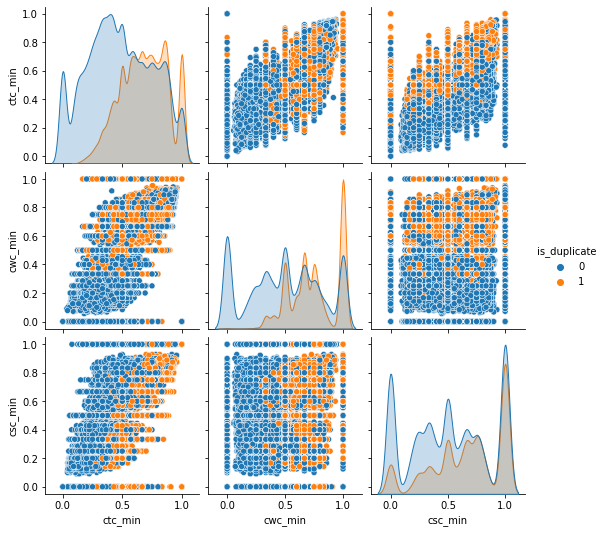

In [35]:
## EDA on advanced features 
# EDA on min columns 
sns.pairplot(df[['ctc_min', 'cwc_min', 'csc_min', 'is_duplicate']],hue='is_duplicate')

The 0 (not dupliate) dominates. 

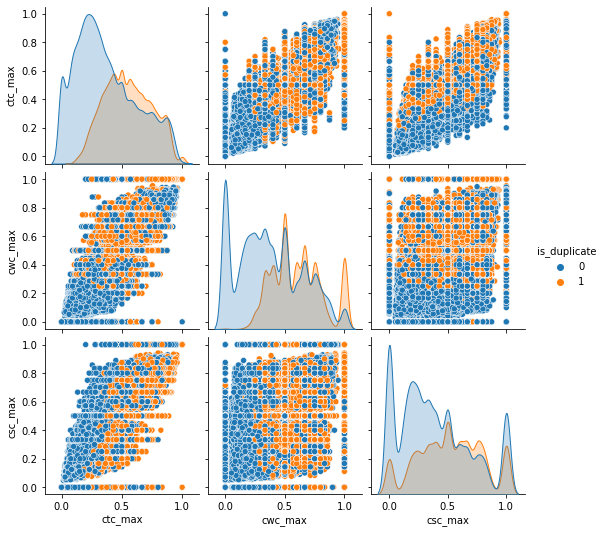

In [36]:
# EDA on max columns 
sns.pairplot(df[['ctc_max', 'cwc_max', 'csc_max', 'is_duplicate']],hue='is_duplicate')

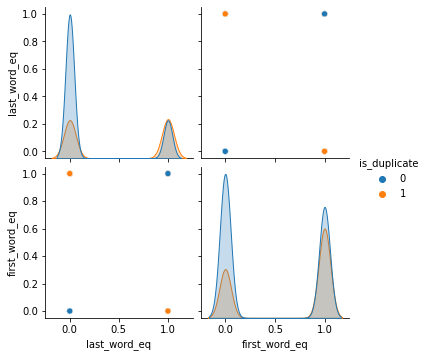

In [37]:
# EDA on last and first word
sns.pairplot(df[['last_word_eq', 'first_word_eq', 'is_duplicate']],hue='is_duplicate')

If the last word or first word does not match, there is a high probability that it is not duplicate.

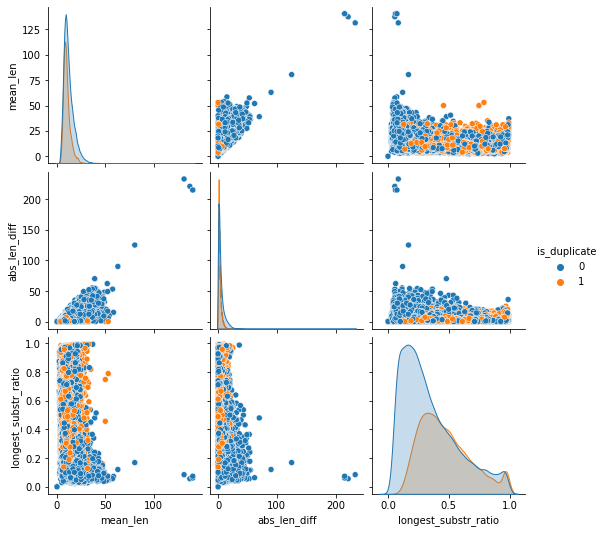

In [38]:
# EDA on length-based features
sns.pairplot(df[['mean_len', 'abs_len_diff','longest_substr_ratio', 'is_duplicate']],hue='is_duplicate')

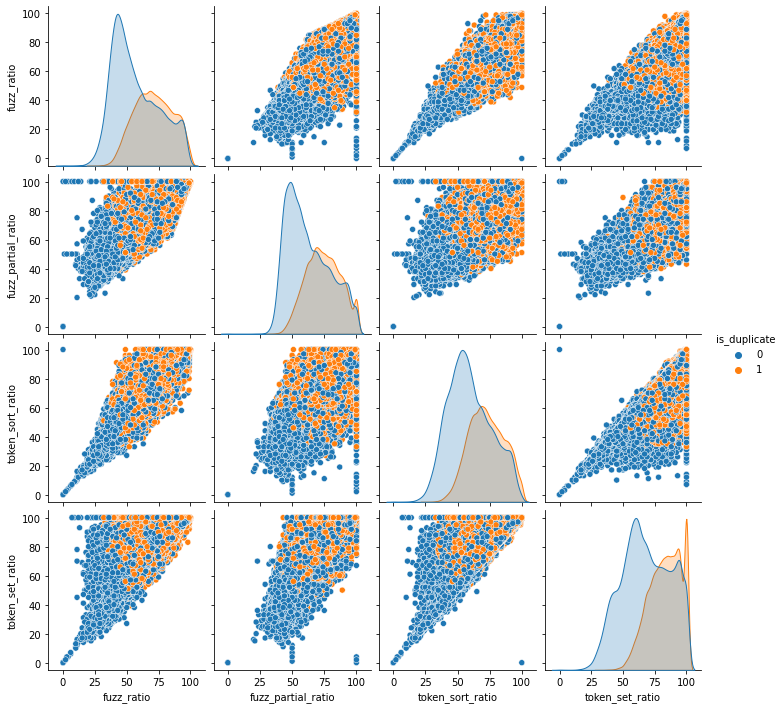

In [39]:
# EDA on fuzzy features
sns.pairplot(df[['fuzz_ratio', 'fuzz_partial_ratio','token_sort_ratio','token_set_ratio', 'is_duplicate']],hue='is_duplicate')

In [40]:
# Using TSNE for Dimentionality reduction for 15 Features(Generated after cleaning the data) to 3 dimention

from sklearn.preprocessing import MinMaxScaler

X = MinMaxScaler().fit_transform(df[['cwc_min', 'cwc_max', 'csc_min', 'csc_max' , 'ctc_min' , 'ctc_max' , 'last_word_eq', 'first_word_eq' , 'abs_len_diff' , 'mean_len' , 'token_set_ratio' , 'token_sort_ratio' ,  'fuzz_ratio' , 'fuzz_partial_ratio' , 'longest_substr_ratio']])
y = df['is_duplicate'].values

In [41]:
from sklearn.manifold import TSNE

tsne2d = TSNE(
    n_components=2,
    init='random', # pca
    random_state=101,
    method='barnes_hut',
    n_iter=1000,
    verbose=2,
    angle=0.5
).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 99999 samples in 0.597s...
[t-SNE] Computed neighbors for 99999 samples in 89.280s...
[t-SNE] Computed conditional probabilities for sample 1000 / 99999
[t-SNE] Computed conditional probabilities for sample 2000 / 99999
[t-SNE] Computed conditional probabilities for sample 3000 / 99999
[t-SNE] Computed conditional probabilities for sample 4000 / 99999
[t-SNE] Computed conditional probabilities for sample 5000 / 99999
[t-SNE] Computed conditional probabilities for sample 6000 / 99999
[t-SNE] Computed conditional probabilities for sample 7000 / 99999
[t-SNE] Computed conditional probabilities for sample 8000 / 99999
[t-SNE] Computed conditional probabilities for sample 9000 / 99999
[t-SNE] Computed conditional probabilities for sample 10000 / 99999
[t-SNE] Computed conditional probabilities for sample 11000 / 99999
[t-SNE] Computed conditional probabilities for sample 12000 / 99999
[t-SNE] Computed conditional probabilities for sa

[t-SNE] Iteration 650: error = 3.4616237, gradient norm = 0.0001762 (50 iterations in 43.401s)
[t-SNE] Iteration 700: error = 3.3445873, gradient norm = 0.0001547 (50 iterations in 43.514s)
[t-SNE] Iteration 750: error = 3.2425652, gradient norm = 0.0001374 (50 iterations in 43.026s)
[t-SNE] Iteration 800: error = 3.1525350, gradient norm = 0.0001234 (50 iterations in 43.297s)
[t-SNE] Iteration 850: error = 3.0721285, gradient norm = 0.0001115 (50 iterations in 42.615s)
[t-SNE] Iteration 900: error = 3.0000188, gradient norm = 0.0001016 (50 iterations in 43.198s)
[t-SNE] Iteration 950: error = 2.9347763, gradient norm = 0.0000933 (50 iterations in 43.146s)
[t-SNE] Iteration 1000: error = 2.8753531, gradient norm = 0.0000860 (50 iterations in 42.874s)
[t-SNE] KL divergence after 1000 iterations: 2.875353


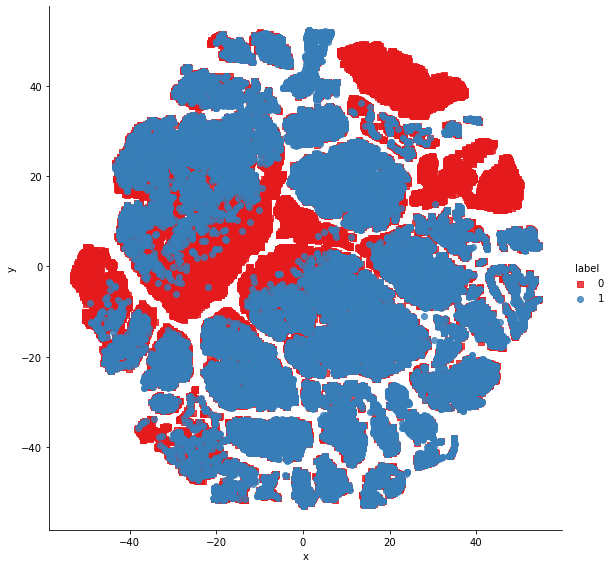

In [42]:
x_df = pd.DataFrame({'x':tsne2d[:,0], 'y':tsne2d[:,1] ,'label':y})

# draw the plot in appropriate place in the grid
sns.lmplot(data=x_df, x='x', y='y', hue='label', fit_reg=False, size=8,palette="Set1",markers=['s','o'])


When the 15 features are bougth to 2D, then difference between 0(non-duplicate) and 1(duplicate) can be somewhat explained. 

In [43]:
tsne3d = TSNE(
    n_components=3,
    init='random', # pca
    random_state=101,
    method='barnes_hut',
    n_iter=1000,
    verbose=2,
    angle=0.5
).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 99999 samples in 0.596s...
[t-SNE] Computed neighbors for 99999 samples in 87.979s...
[t-SNE] Computed conditional probabilities for sample 1000 / 99999
[t-SNE] Computed conditional probabilities for sample 2000 / 99999
[t-SNE] Computed conditional probabilities for sample 3000 / 99999
[t-SNE] Computed conditional probabilities for sample 4000 / 99999
[t-SNE] Computed conditional probabilities for sample 5000 / 99999
[t-SNE] Computed conditional probabilities for sample 6000 / 99999
[t-SNE] Computed conditional probabilities for sample 7000 / 99999
[t-SNE] Computed conditional probabilities for sample 8000 / 99999
[t-SNE] Computed conditional probabilities for sample 9000 / 99999
[t-SNE] Computed conditional probabilities for sample 10000 / 99999
[t-SNE] Computed conditional probabilities for sample 11000 / 99999
[t-SNE] Computed conditional probabilities for sample 12000 / 99999
[t-SNE] Computed conditional probabilities for sa

[t-SNE] Iteration 650: error = 2.9444039, gradient norm = 0.0000765 (50 iterations in 148.620s)
[t-SNE] Iteration 700: error = 2.8295357, gradient norm = 0.0000641 (50 iterations in 147.527s)
[t-SNE] Iteration 750: error = 2.7312024, gradient norm = 0.0000546 (50 iterations in 146.608s)
[t-SNE] Iteration 800: error = 2.6459646, gradient norm = 0.0000472 (50 iterations in 145.731s)
[t-SNE] Iteration 850: error = 2.5712717, gradient norm = 0.0000413 (50 iterations in 145.034s)
[t-SNE] Iteration 900: error = 2.5049791, gradient norm = 0.0000364 (50 iterations in 145.541s)
[t-SNE] Iteration 950: error = 2.4457622, gradient norm = 0.0000324 (50 iterations in 143.599s)
[t-SNE] Iteration 1000: error = 2.3924351, gradient norm = 0.0000291 (50 iterations in 143.208s)
[t-SNE] KL divergence after 1000 iterations: 2.392435


In [44]:
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.offline as py
py.init_notebook_mode(connected=True)

trace1 = go.Scatter3d(
    x=tsne3d[:,0],
    y=tsne3d[:,1],
    z=tsne3d[:,2],
    mode='markers',
    marker=dict(
        sizemode='diameter',
        color = y,
        colorscale = 'Portland',
        colorbar = dict(title = 'duplicate'),
        line=dict(color='rgb(255, 255, 255)'),
        opacity=0.75
    )
)

data=[trace1]
layout=dict(height=800, width=800, title='3d embedding with engineered features')
fig=dict(data=data, layout=layout)
py.iplot(fig, filename='3DBubble')

When the 15 features are bougth to 3D, then difference between 0(non-duplicate) and 1(duplicate) can be somewhat explained. 

In [45]:
# Create a dataframe with ony columns question1 and question2
ques_df = df[['question1','question2']]
ques_df.head()

,question1,question2
398782,what is the best marketing automation tool for...,what is the best marketing automation tool for...
115086,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...
327711,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...
367788,why do so many people in the u s hate the sou...,my boyfriend doesnt feel guilty when he hurts ...
151235,consequences of bhopal gas tragedy,what was the reason behind the bhopal gas tragedy


In [46]:
# Create a new dataframe to only keep the relevant columns
final_df = df.drop(columns=['id','qid1','qid2','question1','question2'])
print(final_df.shape)
final_df.head()

(99999, 23)


,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,word_common,word_total,word_share,cwc_min,cwc_max,...,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,longest_substr_ratio,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
398782,1,75,76,13,13,12,26,0.46,0.874989,0.874989,...,0.923070,1.0,1.0,0.0,13.0,0.855263,99,99,99,99
115086,0,48,56,13,16,8,24,0.33,0.666644,0.499988,...,0.466664,1.0,1.0,3.0,13.5,0.224490,69,67,67,74
327711,0,104,119,28,21,4,38,0.11,0.000000,0.000000,...,0.115384,0.0,0.0,6.0,23.0,0.047619,42,42,39,46
367788,0,58,145,14,32,1,34,0.03,0.000000,0.000000,...,0.000000,0.0,0.0,17.0,21.5,0.050847,37,50,38,40
151235,0,34,49,5,9,3,13,0.23,0.749981,0.599988,...,0.333330,1.0,0.0,4.0,7.0,0.542857,60,71,48,69


In [47]:
from sklearn.feature_extraction.text import TfidfVectorizer

# merge texts
questions = list(ques_df['question1']) + list(ques_df['question2'])


tfidf_vect = TfidfVectorizer(analyzer='word', token_pattern=r'\w{1,}', max_features=3000)
q1_arr_tfidf, q2_arr_tfidf = np.vsplit(tfidf_vect.fit_transform(questions).toarray(),2)

In [48]:
# Convert the obtained featues to a dataframe 

temp_df1 = pd.DataFrame(q1_arr_tfidf, index= ques_df.index)
temp_df2 = pd.DataFrame(q2_arr_tfidf, index= ques_df.index)
temp_df = pd.concat([temp_df1, temp_df2], axis=1)
temp_df.shape

(99999, 6000)

In [49]:
# Concatinate the final dataframe with relevant columns 
final_df = pd.concat([final_df, temp_df], axis=1)
print(final_df.shape)
final_df.head()

(99999, 6023)


,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,word_common,word_total,word_share,cwc_min,cwc_max,...,2990,2991,2992,2993,2994,2995,2996,2997,2998,2999
398782,1,75,76,13,13,12,26,0.46,0.874989,0.874989,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
115086,0,48,56,13,16,8,24,0.33,0.666644,0.499988,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
327711,0,104,119,28,21,4,38,0.11,0.000000,0.000000,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
367788,0,58,145,14,32,1,34,0.03,0.000000,0.000000,...,0.0,0.170067,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
151235,0,34,49,5,9,3,13,0.23,0.749981,0.599988,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [50]:
# 80:20 train-test split
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(final_df.iloc[:,1:].values,final_df.iloc[:,0].values,test_size=0.2,random_state=1)

# Random Forest Classifier

In [51]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
rf = RandomForestClassifier()
rf.fit(X_train,y_train)
y_pred = rf.predict(X_test)
accuracy_score(y_test,y_pred)

0.8038

# XGBoost Classifier

In [52]:
from xgboost import XGBClassifier
xgb = XGBClassifier()
xgb.fit(X_train,y_train)
y_pred1 = xgb.predict(X_test)
accuracy_score(y_test,y_pred1)

0.8004

In [53]:
from sklearn.metrics import confusion_matrix

In this problem, the cost of mis-classification is high. Therefore, we need to choose the model that has less false positive since there not much difference in the accuracy. 

In [54]:
# for random forest model
confusion_matrix(y_test,y_pred)

array([[10747,  1825],
       [ 2099,  5329]], dtype=int64)

In [55]:
## Performance Matrix on test data set on random forest
from sklearn import metrics
y_test_predict = rf.predict(X_test)
model_score = rf.score(X_test, y_test)
print(model_score)
print(metrics.confusion_matrix(y_test, y_pred))
print(metrics.classification_report(y_test, y_pred))

0.8038
[[10747  1825]
 [ 2099  5329]]
              precision    recall  f1-score   support

           0       0.84      0.85      0.85     12572
           1       0.74      0.72      0.73      7428

    accuracy                           0.80     20000
   macro avg       0.79      0.79      0.79     20000
weighted avg       0.80      0.80      0.80     20000



In [56]:
# for xgboost model
confusion_matrix(y_test,y_pred1)

array([[10622,  1950],
       [ 2042,  5386]], dtype=int64)

In [57]:
## Performance Matrix on test data set for XGBoost
y_test_predict = xgb.predict(X_test)
model_score = xgb.score(X_test, y_test)
print(model_score)
print(metrics.confusion_matrix(y_test, y_pred1))
print(metrics.classification_report(y_test, y_pred1))

0.8004
[[10622  1950]
 [ 2042  5386]]
              precision    recall  f1-score   support

           0       0.84      0.84      0.84     12572
           1       0.73      0.73      0.73      7428

    accuracy                           0.80     20000
   macro avg       0.79      0.78      0.79     20000
weighted avg       0.80      0.80      0.80     20000



# Function Defintions

In [58]:
def test_common_words(q1,q2):
    w1 = set(map(lambda word: word.lower().strip(), q1.split(" ")))
    w2 = set(map(lambda word: word.lower().strip(), q2.split(" ")))    
    return len(w1 & w2)

In [59]:
def test_total_words(q1,q2):
    w1 = set(map(lambda word: word.lower().strip(), q1.split(" ")))
    w2 = set(map(lambda word: word.lower().strip(), q2.split(" ")))    
    return (len(w1) + len(w2))

In [60]:
def test_fetch_token_features(q1,q2):
    
    SAFE_DIV = 0.0001 

    STOP_WORDS = stopwords.words("english")
    
    token_features = [0.0]*8
    
    # Converting the Sentence into Tokens: 
    q1_tokens = q1.split()
    q2_tokens = q2.split()
    
    if len(q1_tokens) == 0 or len(q2_tokens) == 0:
        return token_features

    # Get the non-stopwords in Questions
    q1_words = set([word for word in q1_tokens if word not in STOP_WORDS])
    q2_words = set([word for word in q2_tokens if word not in STOP_WORDS])
    
    #Get the stopwords in Questions
    q1_stops = set([word for word in q1_tokens if word in STOP_WORDS])
    q2_stops = set([word for word in q2_tokens if word in STOP_WORDS])
    
    # Get the common non-stopwords from Question pair
    common_word_count = len(q1_words.intersection(q2_words))
    
    # Get the common stopwords from Question pair
    common_stop_count = len(q1_stops.intersection(q2_stops))
    
    # Get the common Tokens from Question pair
    common_token_count = len(set(q1_tokens).intersection(set(q2_tokens)))
    
    
    token_features[0] = common_word_count / (min(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[1] = common_word_count / (max(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[2] = common_stop_count / (min(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[3] = common_stop_count / (max(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[4] = common_token_count / (min(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    token_features[5] = common_token_count / (max(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    
    # Last word of both question is same or not
    token_features[6] = int(q1_tokens[-1] == q2_tokens[-1])
    
    # First word of both question is same or not
    token_features[7] = int(q1_tokens[0] == q2_tokens[0])
    
    return token_features


In [61]:
def test_fetch_length_features(q1,q2):
    
    length_features = [0.0]*3
    
    # Converting the Sentence into Tokens: 
    q1_tokens = q1.split()
    q2_tokens = q2.split()
    
    if len(q1_tokens) == 0 or len(q2_tokens) == 0:
        return length_features
    
    # Absolute length features
    length_features[0] = abs(len(q1_tokens) - len(q2_tokens))
    
    #Average Token Length of both Questions
    length_features[1] = (len(q1_tokens) + len(q2_tokens))/2
    
    strs = list(distance.lcsubstrings(q1, q2))
    length_features[2] = len(strs[0]) / (min(len(q1), len(q2)) + 1)
    
    return length_features

In [62]:
def test_fetch_fuzzy_features(q1,q2):
    
    fuzzy_features = [0.0]*4
    
    # fuzz_ratio
    fuzzy_features[0] = fuzz.QRatio(q1, q2)

    # fuzz_partial_ratio
    fuzzy_features[1] = fuzz.partial_ratio(q1, q2)

    # token_sort_ratio
    fuzzy_features[2] = fuzz.token_sort_ratio(q1, q2)

    # token_set_ratio
    fuzzy_features[3] = fuzz.token_set_ratio(q1, q2)

    return fuzzy_features

In [63]:
def query_point_creator(q1,q2):
    
    input_query = []
    
    # preprocess
    q1 = preprocess(q1)
    q2 = preprocess(q2)
    
    # fetch basic features
    input_query.append(len(q1))
    input_query.append(len(q2))
    
    input_query.append(len(q1.split(" ")))
    input_query.append(len(q2.split(" ")))
    
    input_query.append(test_common_words(q1,q2))
    input_query.append(test_total_words(q1,q2))
    input_query.append(round(test_common_words(q1,q2)/test_total_words(q1,q2),2))
    
    # fetch token features
    token_features = test_fetch_token_features(q1,q2)
    input_query.extend(token_features)
    
    # fetch length based features
    length_features = test_fetch_length_features(q1,q2)
    input_query.extend(length_features)
    
    # fetch fuzzy features
    fuzzy_features = test_fetch_fuzzy_features(q1,q2)
    input_query.extend(fuzzy_features)
    
    # tfidf feature for q1
    q1_tfidf = tfidf_vect.transform([q1]).toarray()
    
    # tfidf feature for q2
    q2_tfidf = tfidf_vect.transform([q2]).toarray()
    
    return np.hstack((np.array(input_query).reshape(1,22),q1_tfidf,q2_tfidf))

In [64]:
q1 = 'Where is the capital of India?'
q2 = 'What is the current capital of India?'
q3 = 'What is the current capital of Pakistan?'

query_features = query_point_creator(q1, q2)
print(query_features)

[[29. 36.  6. ...  0.  0.  0.]]


In [65]:
rf.predict(query_point_creator(q1,q2))

array([1], dtype=int64)

In [66]:
rf.predict(query_point_creator(q1,q3))

array([0], dtype=int64)

# Saving Model Weights

In [67]:
import pickle

pickle.dump(rf,open('../Quora Duplicate Question Pair Tfidf/Streamlit_app/model.pkl','wb'))
pickle.dump(tfidf_vect,open('../Quora Duplicate Question Pair Tfidf/Streamlit_app/tfidf_vect.pkl','wb'))